# Thesis draft

## Библиотеки

In [109]:
import numpy as np
import os.path
import glob
import pandas as pd

from io import BytesIO
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import train_test_split
from scipy.io import loadmat

from matplotlib import pyplot as plt

from scipy.stats import multivariate_normal
from scipy.stats import pearsonr

from scipy.stats import gamma
from scipy.stats import wishart

## Данные 

Будем рассматривать в качестве выборок несоклько вариантов разбиения данных.
Первый случай: данные об одной обезьяне, снятые в разные дни. Ведь в идеале хочется достичь результата, при которому модель, построенная один раз, работала для последующих экспериментов.
Второй случай: стандартное разбиение одной выборки на train/test. В этом случае при каждой обработк данных - сначала строится модель, затем с её помощью обрабатываются данные.

In [2]:
path_name_train = '20100802S1_ECoG_Motion6'
path_name_test = '20100726S1_ECoG_Motion6'

В первую очередь рассматриваем не обработанный, сырой ECOG. Затем сравним результаты наших методов с ecog'ом, предобработанным на основе статьи Мотренко.

In [3]:
def get_ecog(dir):
    #n_ch - number of channels
    n_ch = len(glob.glob(os.path.join(dir, 'ECoG_ch*.mat')))
    ECoG = []
    for ch in range(1, n_ch + 1):
        ECoGData = loadmat(os.path.join(dir, 'ECoG_ch%d.mat' % ch))
        ECoGData = ECoGData['ECoGData_ch%d' % ch]
        ECoG.append(ECoGData[0])

    ECoG = np.array(ECoG)
    
    Time = loadmat(os.path.join(dir, 'ECoG_time.mat'))
    Time = Time['ECoGTime']

    return ECoG.T, Time.T

In [160]:
len(time_train)

1045828

In [161]:
len(time_test)

1030675

In [4]:
# data for the first type of train|test split

data_train, time_train = get_ecog(path_name_train)
data_test, time_test = get_ecog(path_name_test)
#df = pd.DataFrame(data)

In [5]:
# data for the second type of train|test split
X_train, X_test = train_test_split(data_train, test_size=0.33, random_state=42)

In [6]:
#(x,y) coordinates for channels 1-64 based on the image of places (b.png)
#centers[i] -coordinates of the i channel

centers = [(4,1), (6, 1), \
           (3, 2), (5, 2), (7,2),\
           (2,3), (4, 3), (6, 3), \
           (1, 4), (3, 4), (5, 4), (7, 4),\
           (2, 5), (4, 5), (6, 5), (8, 5),\
           (1, 6), (3, 6), (5, 6), (7, 6),\
           (2, 7), (4, 7), (6, 7), (8, 7),\
           (1, 8), (3, 8), (5, 8), (7, 8),\
           (2, 9), (4, 9), (6, 9), (8, 9),\
           (1, 10), (3, 10), (5, 10), (7, 10),\
           (2, 11), (4, 11), (6, 11), (8, 11),\
           (1, 12), (3, 12), (5, 12), (7, 12),\
           (2, 13), (4, 13), (6, 13), (8, 13),\
           (1, 14), (3, 14), (5, 14), (7, 14),\
           (2, 15), (4, 15), (6, 15), (8, 15),\
           (1, 16), (3, 16), (5, 16), (7, 16),\
           (2, 17), (4, 17), (6, 17), (8, 17)]

## 1. ECOG local models

Взглянем на полный ECoG, который принимали на первом канале

In [7]:
title_font = {'family':'Arial', 'size': 20, 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'family':'Arial', 'size': 16}


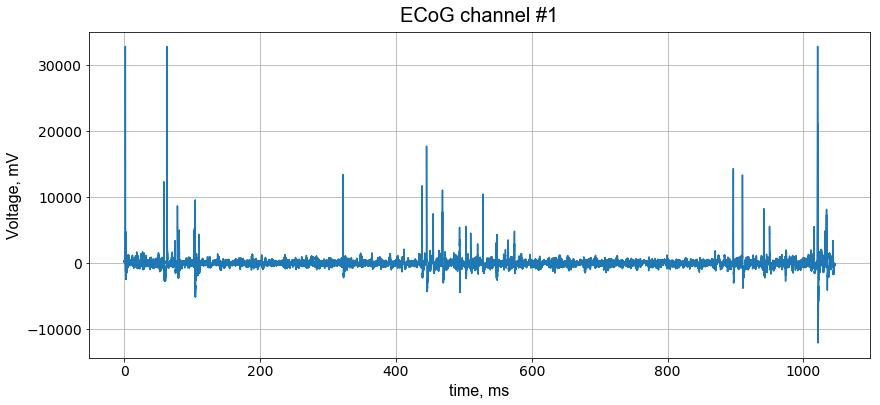

In [9]:
plt.figure(figsize=(14,6))
plt.plot(time_train, data_train[:,0])
plt.xticks( fontsize=14, rotation=0)
plt.yticks(fontsize=14, rotation=0)
plt.title('ECoG channel #1', **title_font)
plt.xlabel('time, ms', **axis_font)
plt.ylabel('Voltage, mV', **axis_font)
plt.grid(True)
plt.show()
plt.close()

In [40]:
data = data_train
time = time_train

In [47]:
# number of values taken for observation

N = 100000


### Гипотеза нормального распределения

Определяем функции, которые находят среднее, дисперсию и функцию, которая получает нормировочную константу интенсивности в зависимости от найденного среднего

In [61]:
def get_mean(ECoG, time):
    mean = []
    intens = 0
    for j in range(len(time)):
        intens_sum = 0
        x, y = 0, 0
        for i in range(64):
            center_x, center_y = centers[i]
            intens = abs(ECoG[j,i])
            intens_sum += intens
            x += center_x * intens
            y += center_y * intens
            
        mean.append([x / intens_sum, y / intens_sum])
        
    return np.array(mean)


def get_disp(mean, ECoG, time):
    disp = []
    for j in range(len(time)):
        mean_x, mean_y = mean[j]
        intens_sum = 0
        disp_x, disp_y = 0, 0
        for i in range(64):
            center_x, center_y = centers[i]
            intens = abs(ECoG[j, i])
            intens_sum += intens
            disp_x += (center_x - mean_x)**2 * intens
            disp_y += (center_y - mean_y)**2 * intens

        disp.append([disp_x / intens_sum, disp_y / intens_sum])
    return np.array(disp)


def get_intens(mean, disp, mv, ECoG, time):
    intens = []
    for j in range(len(time)):
        mean_x, mean_y = mean[j]
        # Adjust our mean to integer points we have in centers
        x = int(round(mean_x))
        y = int(round(mean_y))
        if (x, y) in centers:
            i = centers.index((x,y))
        else:
            if y<17:
                y = y+1
            else:
                y = y-1
            i = centers.index((x,y))
        i = 0;
        
        pred_int = mv[j].pdf(centers[0])
        intens.append(ECoG[j,i]/pred_int)
    return intens

Считаем параметры нормального распределения

In [49]:
%%time
m = get_mean(data[:N], time[:N])
d = get_disp(m, data[:N], time[:N])

Wall time: 1min 25s


Восстанавливаем по параметрам $\mu$ и $\sigma^2$ распределение сигнала в каждый момент времени

In [50]:
%%time
#Calcuate bivariate normal distribution for each moment of time

mv = []
for i in range(len(m)):
    mv.append(multivariate_normal([m[i, 0], m[i, 1]], [[d[i,0], 0], [0, d[i, 1]]]))


Wall time: 30.3 s


Считаем на всякий случай отношение реальной интенсивности сигнала  к полученному в восстановленном распределении в средней точке

In [64]:
%%time
intens = get_intens(m, d, mv, data[:N], time[:N])

Wall time: 2.64 s


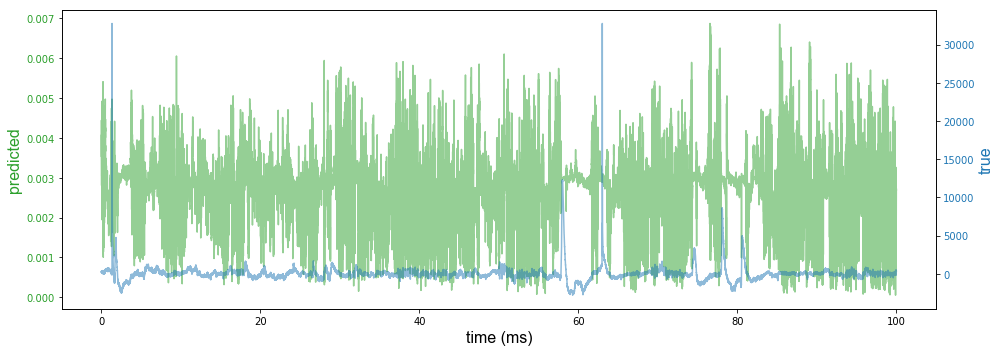

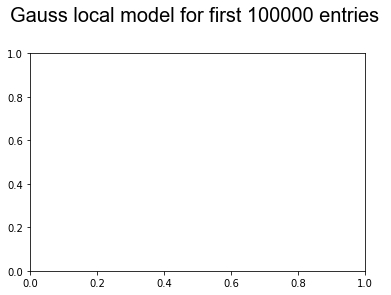

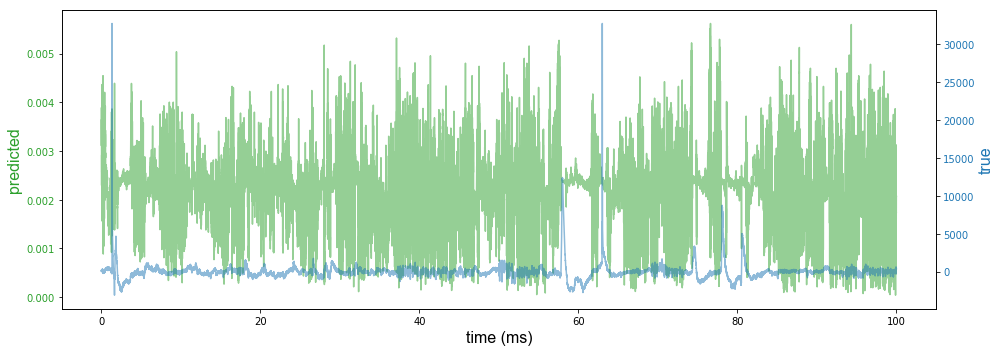

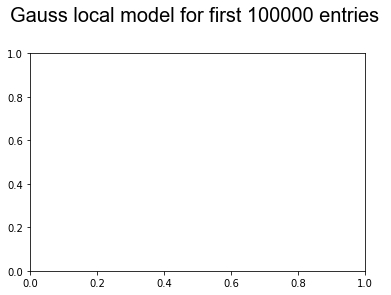

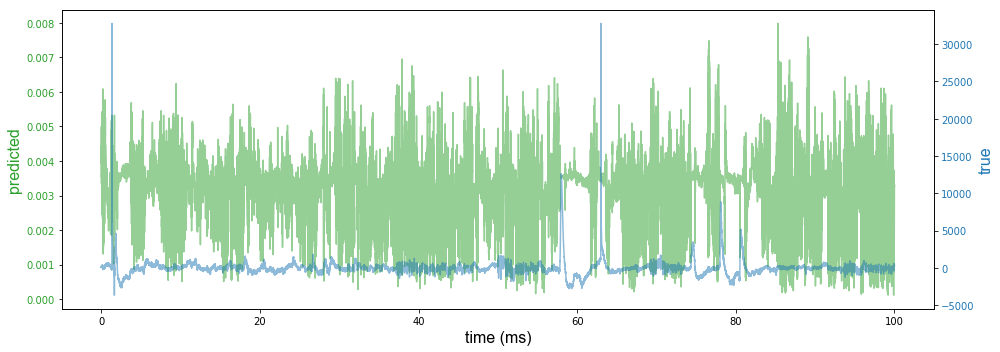

...

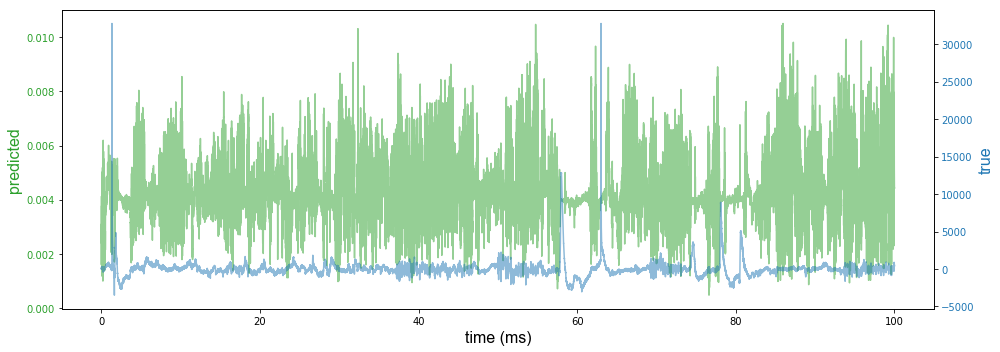

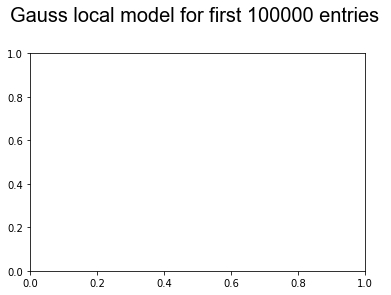

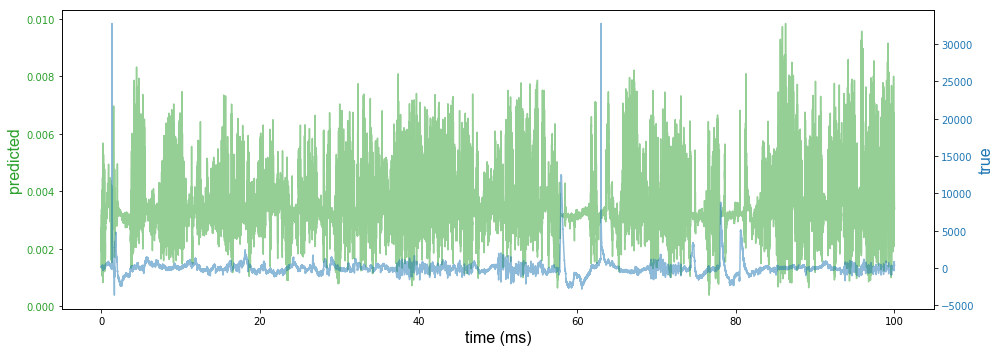

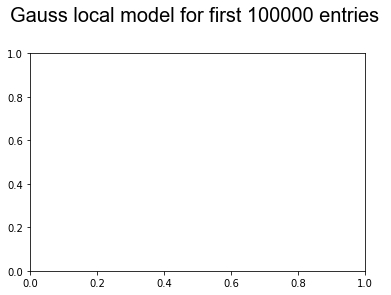

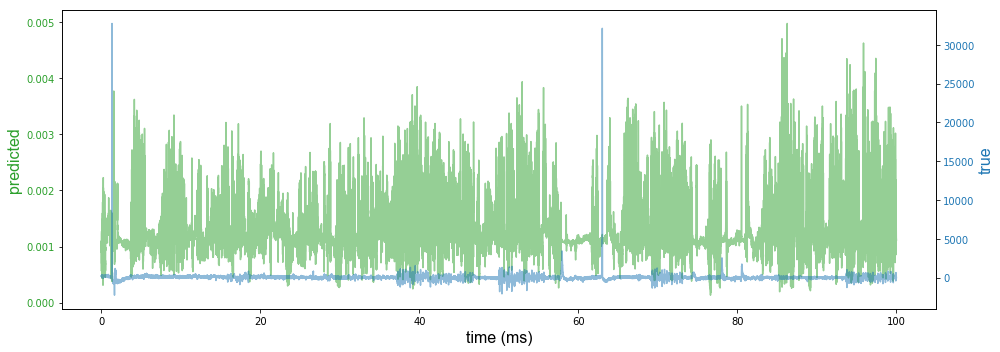

Wall time: 2min 14s


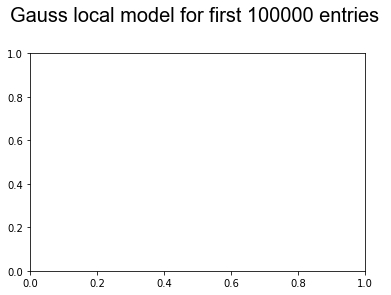

In [54]:
%%time
for channel in range(len(centers)):
    point = centers[channel]
    rv = []
    
    for j in range(len(mv)):
            p = mv[j].pdf(point)
            rv.append(p)
            
    fig, ax1 = plt.subplots(1,1, figsize = (14, 5))
    color = 'tab:green'
    ax1.set_xlabel('time (ms)', **axis_font)
    ax1.set_ylabel('predicted', color=color, **axis_font)
    ax1.plot(time[:N], rv, color=color, alpha = 0.5)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel('true', color=color, **axis_font) 
    ax2.plot(time[:N], data[:N, channel], color=color, alpha = 0.5)
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.title('Gauss local model for first %i entries \n' %N , **title_font)
    plt.show()
    
    


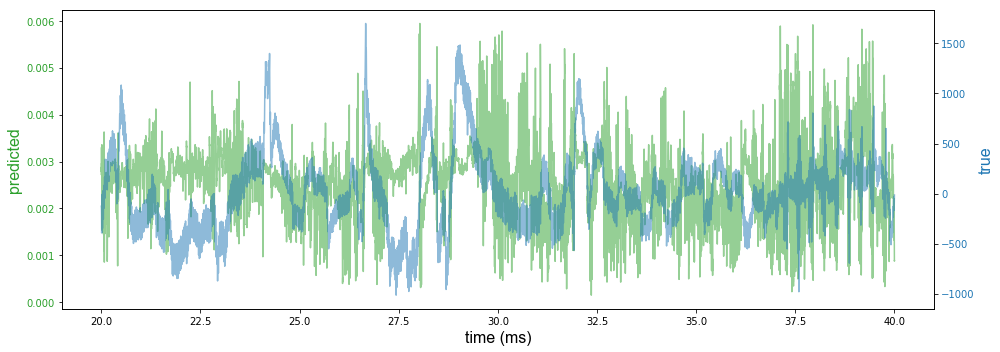

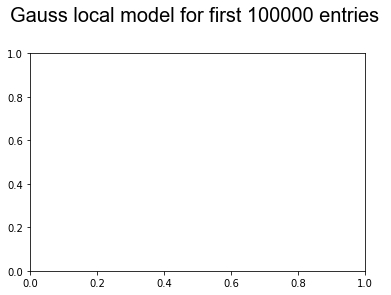

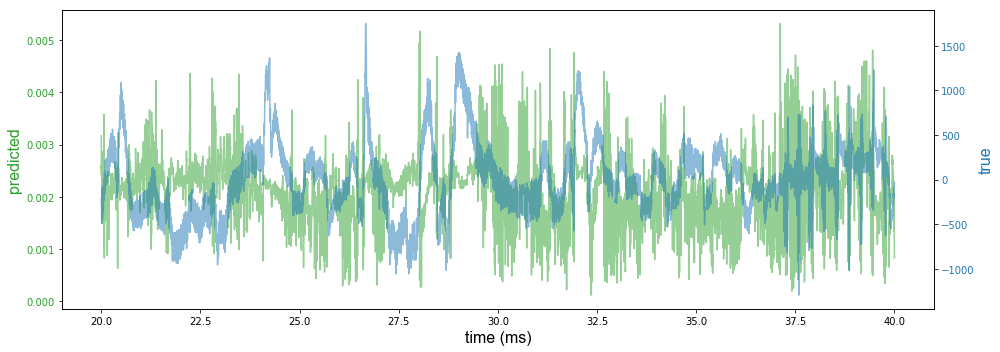

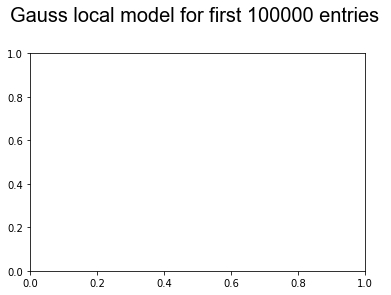

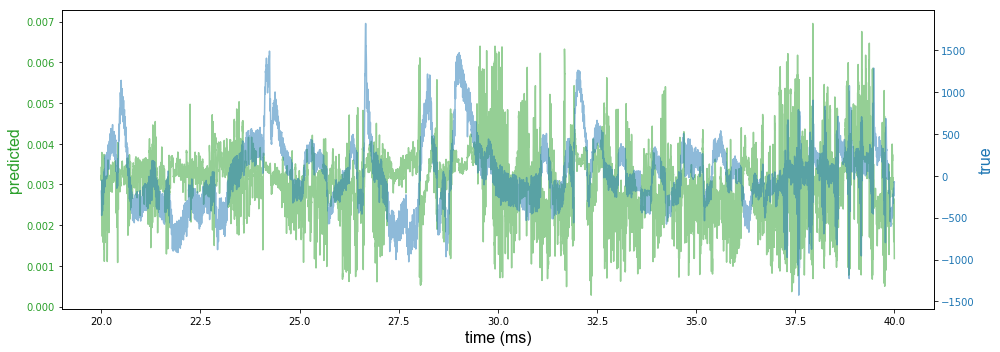

...

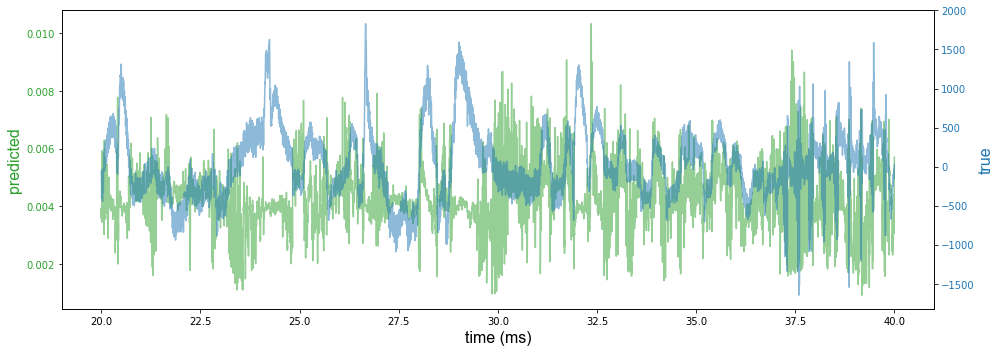

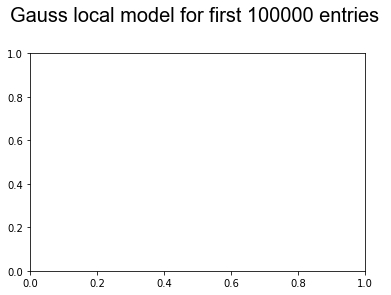

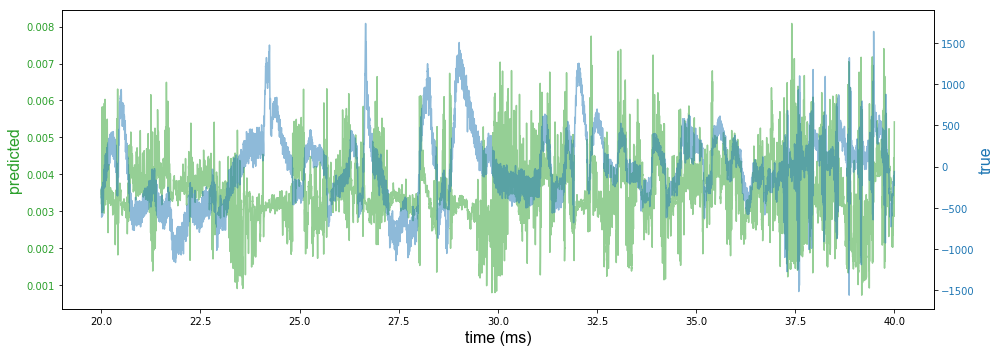

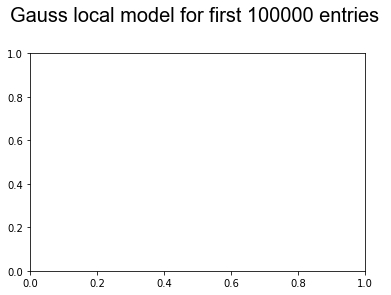

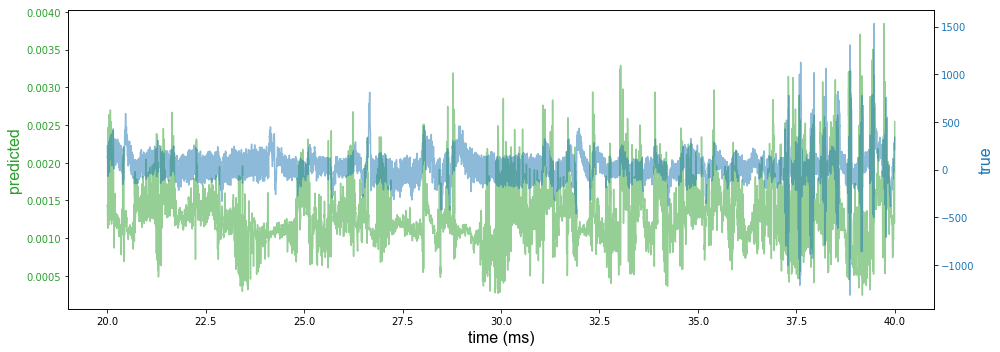

Wall time: 2min 4s


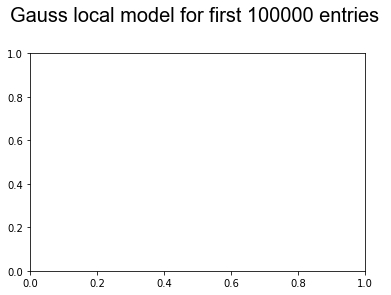

In [55]:
%%time
for channel in range(len(centers)):
    point = centers[channel]
    rv = []
  
    for j in range(len(mv)):
            p = mv[j].pdf(point)
            rv.append(p)
            
    fig, ax1 = plt.subplots(1,1, figsize = (14, 5))
    color = 'tab:green'
    ax1.set_xlabel('time (ms)', **axis_font)
    ax1.set_ylabel('predicted', color=color, **axis_font)
    ax1.plot(time[20000:40000], rv[20000:40000], color=color, alpha = 0.5)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel('true', color=color, **axis_font) 
    ax2.plot(time[20000:40000], data[20000:40000, channel], color=color, alpha = 0.5)
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
      
    plt.title('Gauss local model for first %i entries \n' %N , **title_font)
    plt.show()
  

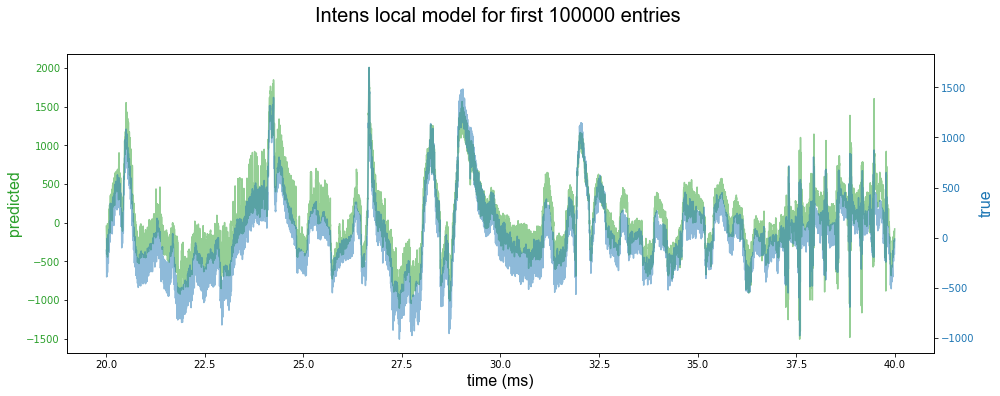

Wall time: 1.7 s


In [65]:
%%time
for channel in range(len(centers)):
    point = centers[channel]
    rv = []
  
    for j in range(len(mv)):
            p = mv[j].pdf(point)
            rv.append(p)
            
    fig, ax1 = plt.subplots(1,1, figsize = (14, 5))
    color = 'tab:green'
    ax1.set_xlabel('time (ms)', **axis_font)
    ax1.set_ylabel('predicted', color=color, **axis_font)
    ax1.plot(time[20000:40000], intens[20000:40000], color=color, alpha = 0.5)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel('true', color=color, **axis_font) 
    ax2.plot(time[20000:40000], data[20000:40000, channel], color=color, alpha = 0.5)
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
      
    plt.title('Intens local model for first %i entries \n' %N , **title_font)
    plt.show()

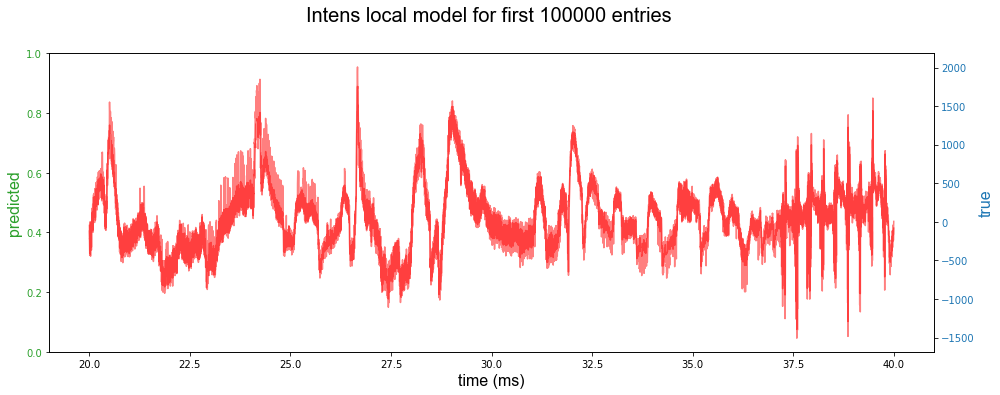

Wall time: 2.21 s


In [148]:
%%time
for channel in range(1):
    point = centers[channel]
    rv = []
  
    for j in range(len(mv)):
            p = mv[j].pdf(point)
            rv.append(p*intens[j])
            
    fig, ax1 = plt.subplots(1,1, figsize = (14, 5))
    color = 'tab:green'
    ax1.set_xlabel('time (ms)', **axis_font)
    ax1.set_ylabel('predicted', color=color, **axis_font)
    #ax1.plot(time[20000:40000], rv[20000:40000], color='green', alpha = 0.5)
    
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel('true', color=color, **axis_font) 
    #ax2.plot(time[20000:40000], data[20000:40000, channel], color='blue', alpha = 0.5)
    ax2.plot(time[20000:40000], data[20000:40000, 17], color='red', alpha = 0.5) 
    ax2.plot(time[20000:40000], intens[20000:40000], color='red', alpha = 0.5)
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
      
    plt.title('Intens local model for first %i entries \n' %N , **title_font)
    
    plt.show()

In [75]:
pearsonr(rv[20000:40000], data[20000:40000,0])

(0.9688619761211918, 0.0)

In [90]:
data[20000:40000,0]

array([-127, -144, -141, ...,  -47,  -39,  -15], dtype=int16)

In [91]:
rv[20000:40000]

[]

In [95]:
from sklearn.metrics import mean_absolute_error
mean_absolute_error(intens[20000:40000], data[20000:40000,0])
mean_absolute_error(rv[20000:40000], data[20000:40000,0])

290.1713676495743

In [76]:
pearsonr(intens[20000:40000], data[20000:40000,0])

(0.9601181006066967, 0.0)

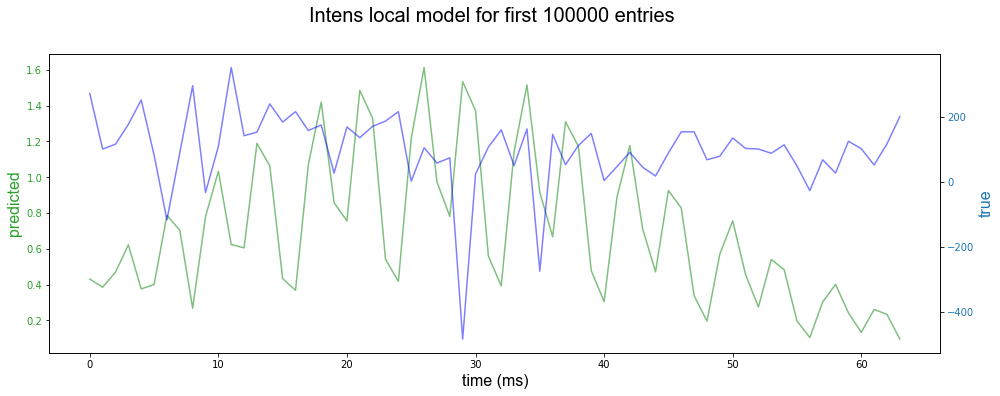

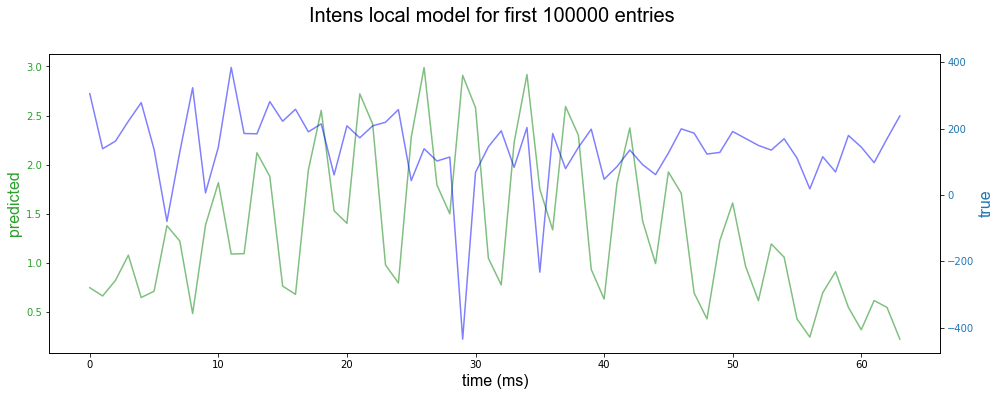

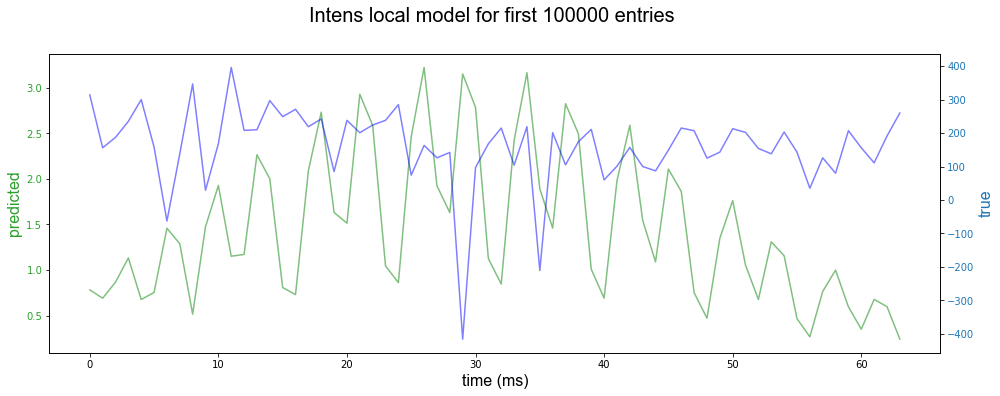

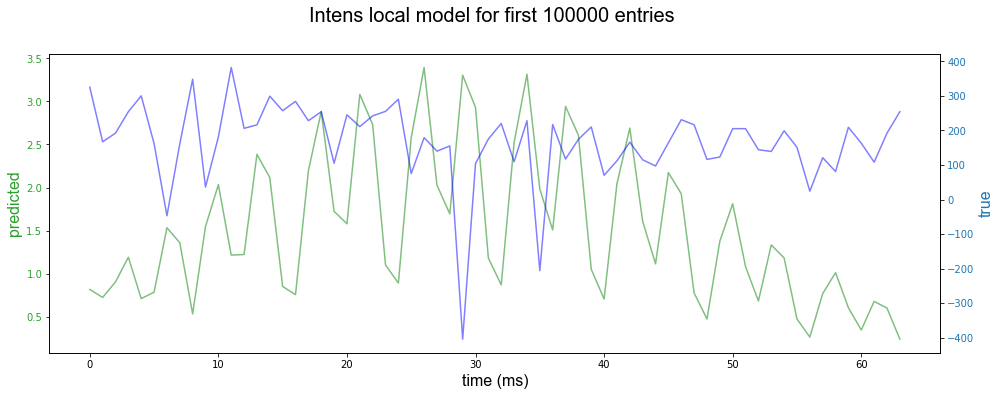

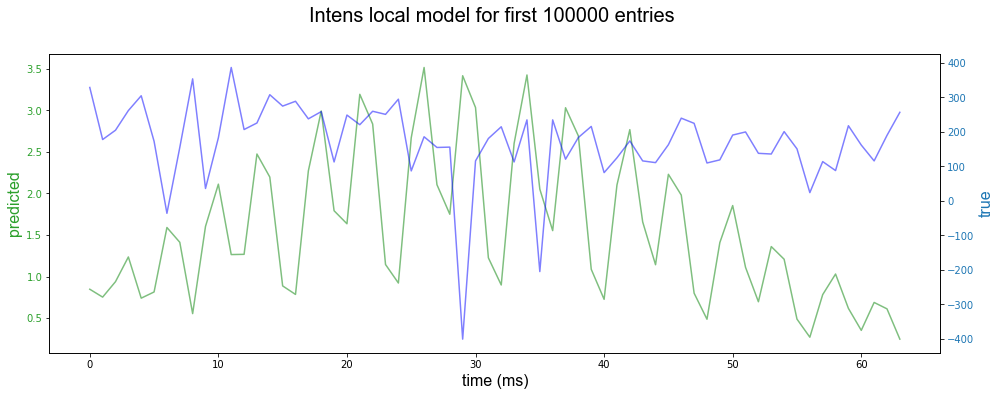

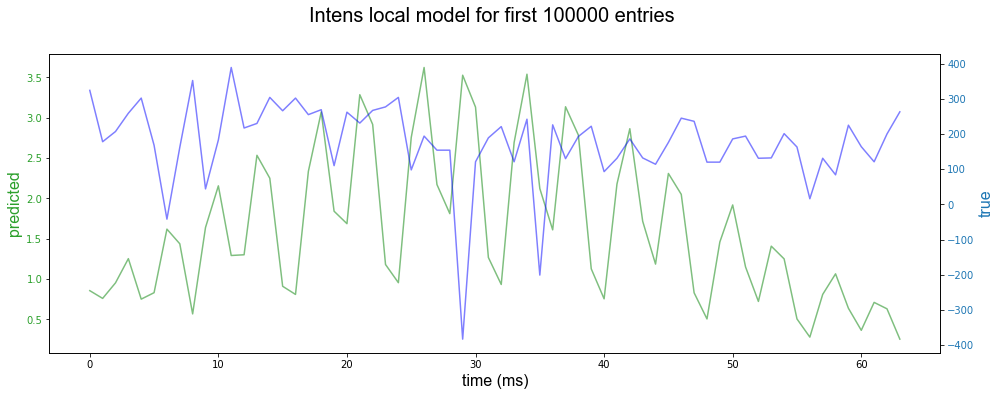

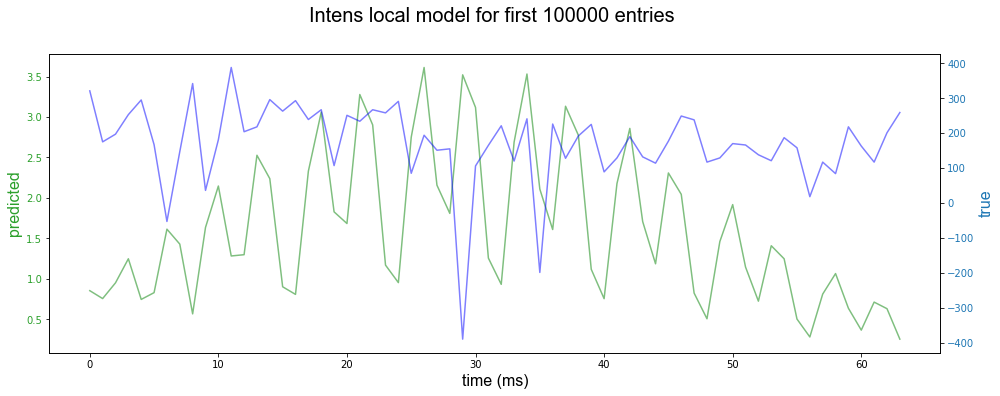

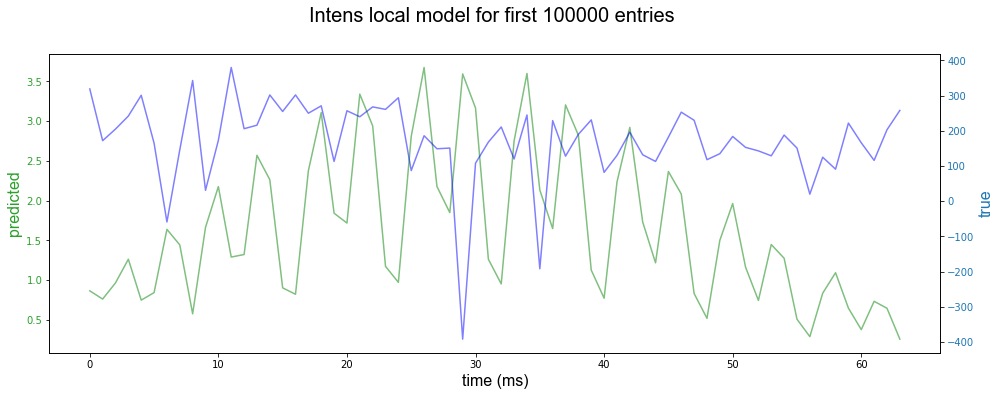

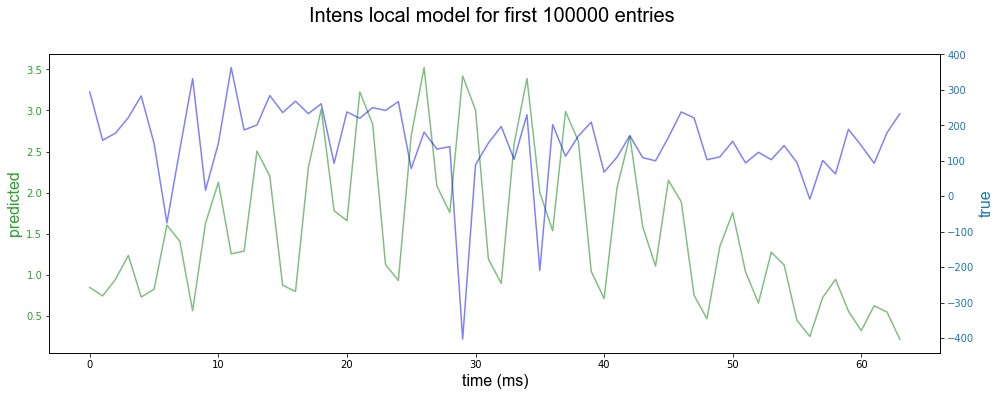

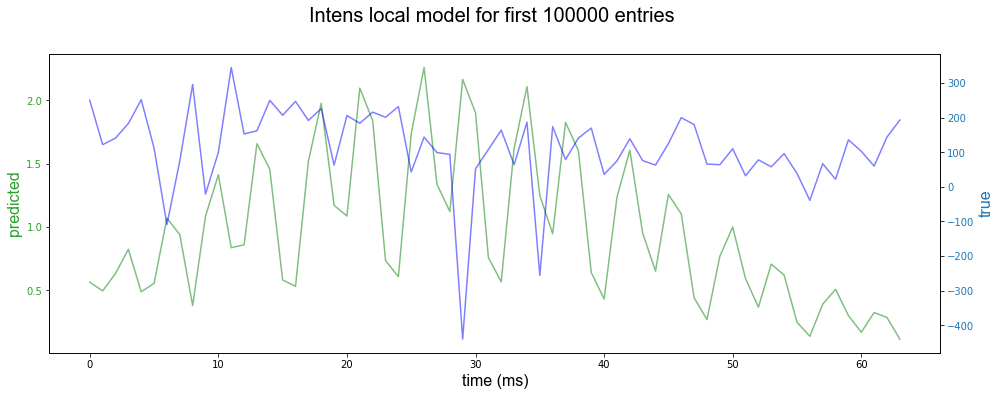

In [88]:
for t in range(10):
    #point = centers[channel]
    rv = []
  
    for j in range(len(centers)):
            p = mv[t].pdf(centers[j])
            rv.append(p*intens[t])
            
    fig, ax1 = plt.subplots(1,1, figsize = (14, 5))
    color = 'tab:green'
    ax1.set_xlabel('time (ms)', **axis_font)
    ax1.set_ylabel('predicted', color=color, **axis_font)
    ax1.plot(range(64), (np.array(rv)), color='green', alpha = 0.5)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel('true', color=color, **axis_font) 
    ax2.plot(range(64), (data[t, :]), color='blue', alpha = 0.5)
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
      
    plt.title('Intens local model for first %i entries \n' %N , **title_font)
    
    plt.show()

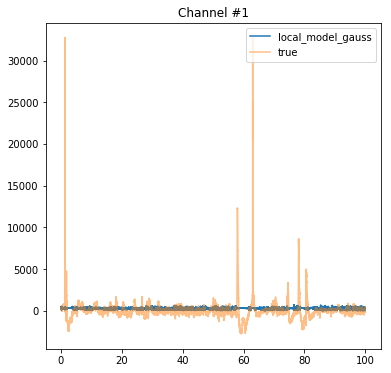

Wall time: 2.05 s


In [96]:
%%time
for channel in range(1):#(len(centers)):
    point = centers[channel]
    plt.figure(figsize = (6, 6))
    rv = []
    for j in range(len(mv)):
        p = mv[j].pdf(point)
        rv.append(p*100000)
    rv = np.array(rv)
    #plt.plot(time[:N], np.array(intens)/1000, label = 'local_model_gauss')
    plt.plot(time[:N], rv, label = 'local_model_gauss')
    plt.plot(time[:N], data[:N, channel], label = 'true', alpha = 0.5)
    plt.title('Channel #'+str(channel+1))
    plt.legend()
    plt.show()

### Гипотеза гамма-распределения 

In [97]:
def gamma_params(m, d):
    a = []
    b = []
    for i in range(len(m)):
        bi = m[i]/d[i]
        ai = bi*m[i]
        a.append(ai)
        b.append(bi)
    return np.array(a), np.array(b)

Можем ли мы по пареметрам нормального распределения восстановить эког? не совсем, но можем. посмотрим, можем ли восстановить движение!

In [98]:
a, b = gamma_params(m, d)

In [99]:


a_x = a[:,0]
a_y = a[:,1]
b_x = b[:,0]
b_y = b[:,1]

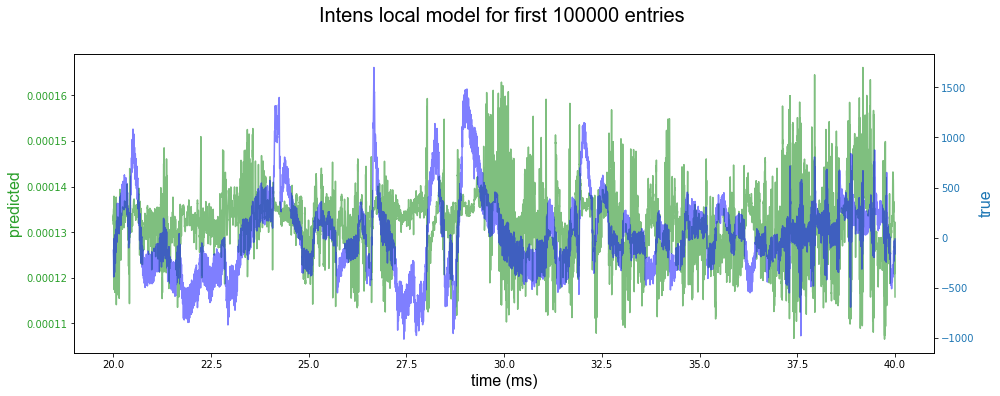

In [104]:
for channel in range(1):
    #point = centers[channel]
    g_d = []
    for j in range(len(m)):
        p = wishart.pdf(point, 2, [[m[j, 0], 0], [0, m[j, 1]]])
        g_d.append(p)
    
    fig, ax1 = plt.subplots(1,1, figsize = (14, 5))
    color = 'tab:green'
    ax1.set_xlabel('time (ms)', **axis_font)
    ax1.set_ylabel('predicted', color=color, **axis_font)
    ax1.plot(time[20000:40000], (np.array(g_d)[20000:40000]), color='green', alpha = 0.5)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel('true', color=color, **axis_font) 
    ax2.plot(time[20000:40000], (data[20000:40000, channel]), color='blue', alpha = 0.5)
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
      
    plt.title('Intens local model for first %i entries \n' %N , **title_font)
    
    plt.show()

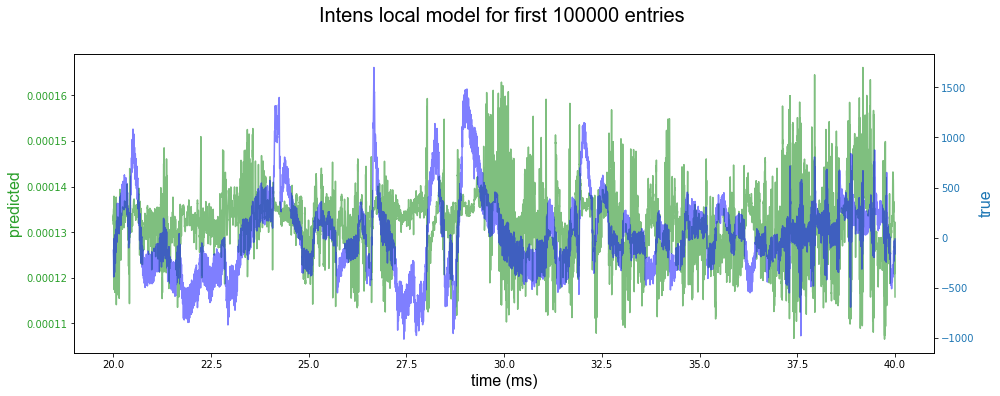

In [107]:
for channel in range(1):
    #point = centers[channel]
    g_d = []
    for j in range(len(m)):
        p = wishart.pdf(point, 2, [[m[j, 0], 0], [0, m[j, 1]]])
        g_d.append(p)
    
    fig, ax1 = plt.subplots(1,1, figsize = (14, 5))
    color = 'tab:green'
    ax1.set_xlabel('time (ms)', **axis_font)
    ax1.set_ylabel('predicted', color=color, **axis_font)
    ax1.plot(time[20000:40000], (np.array(g_d)[20000:40000]), color='green', alpha = 0.5)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel('true', color=color, **axis_font) 
    ax2.plot(time[20000:40000], (data[20000:40000, channel]), color='blue', alpha = 0.5)
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
      
    plt.title('Intens local model for first %i entries \n' %N , **title_font)
    
    plt.show()

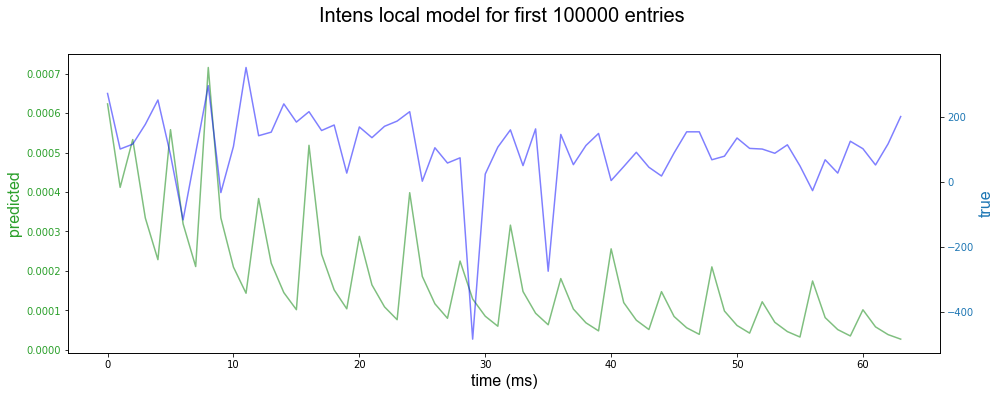

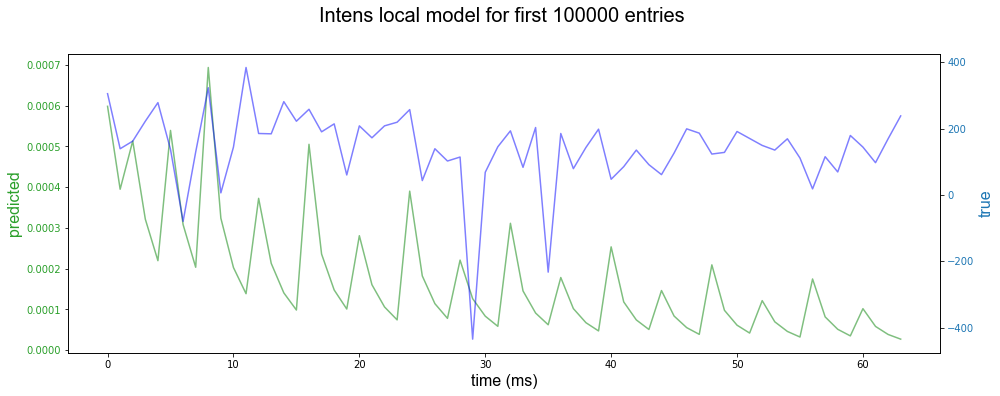

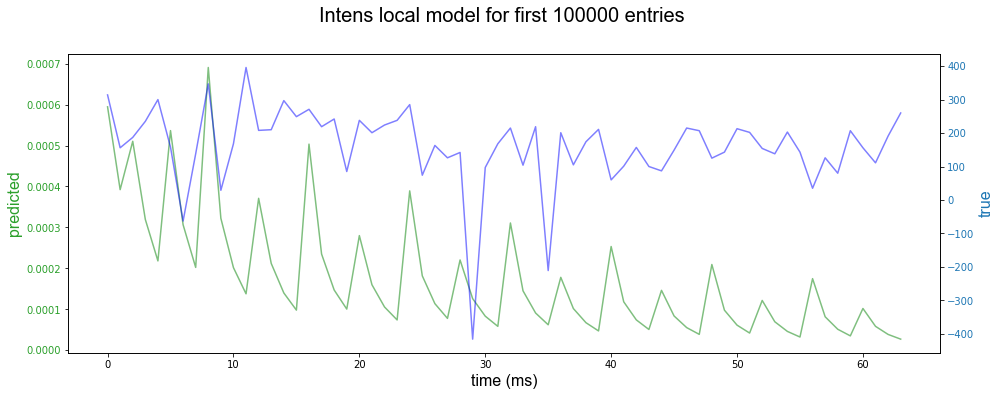

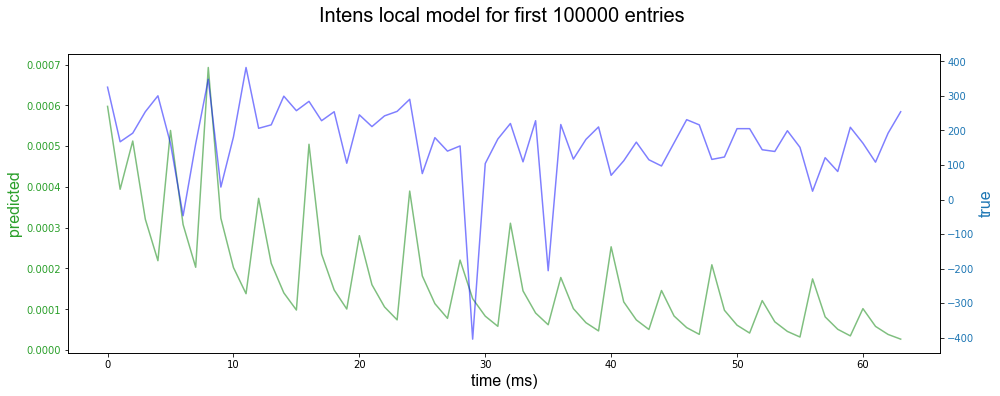

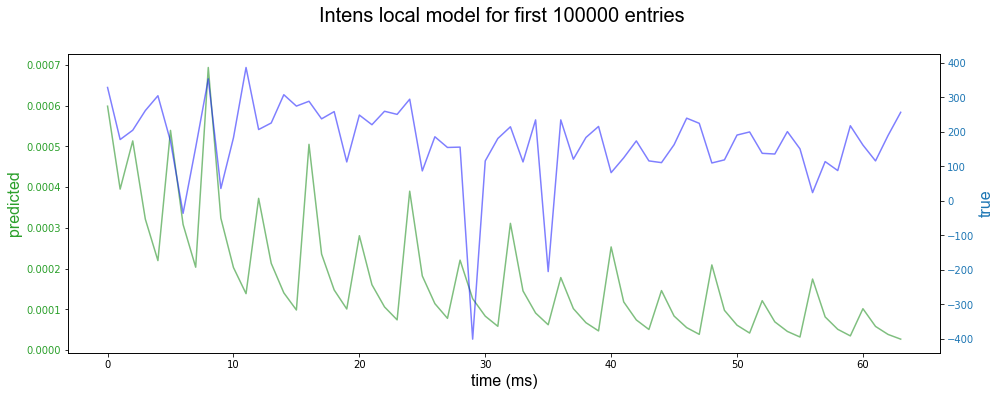

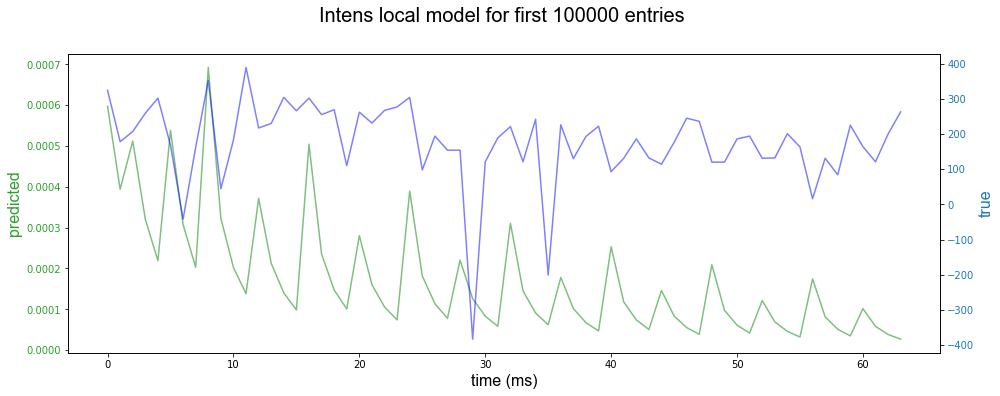

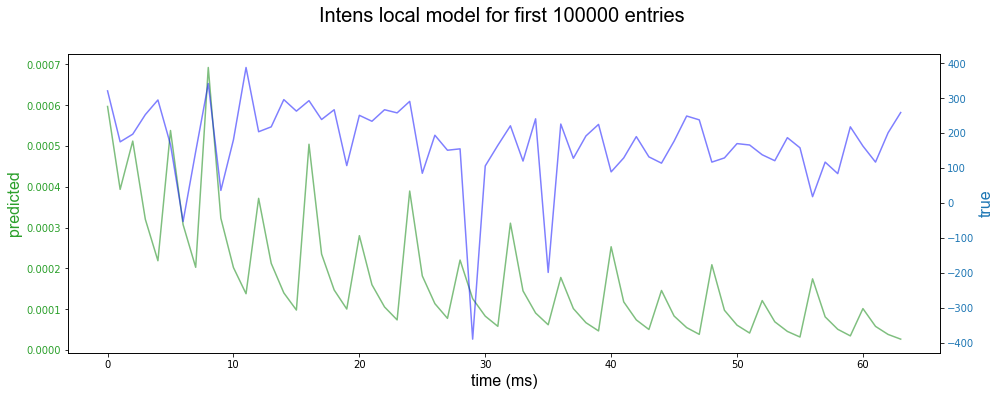

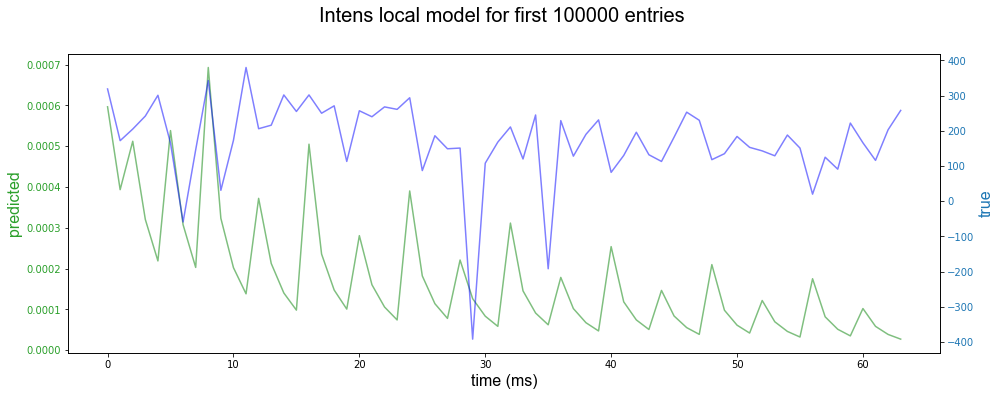

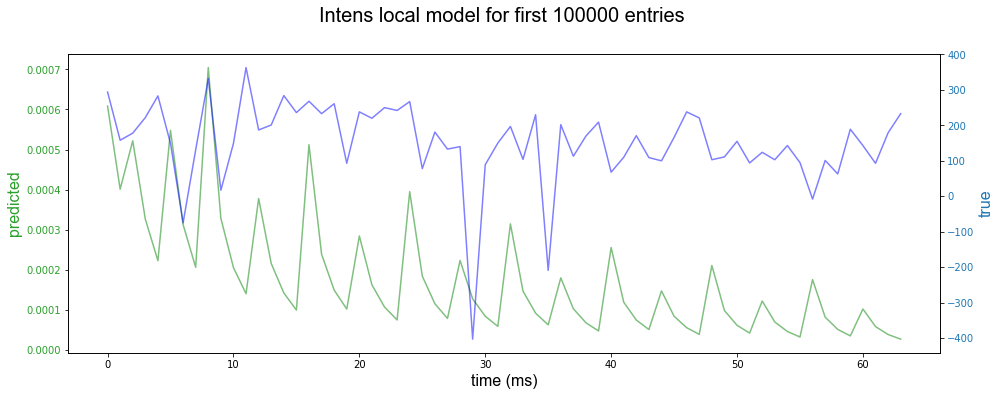

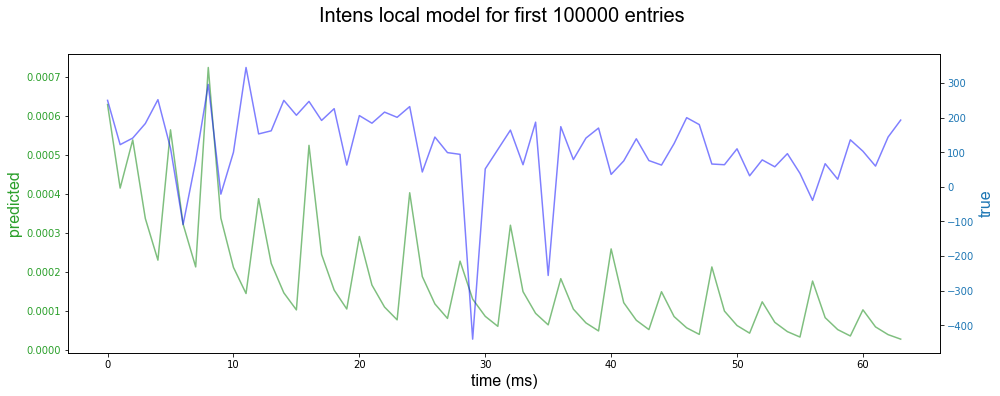

In [111]:
for t in range(10):
    #point = centers[channel]
    g_d = []
  
    for j in (centers):
            p = wishart.pdf(j, 2, [[m[t, 0], 0], [0, m[t, 1]]])
            g_d.append(p)
            
            
    fig, ax1 = plt.subplots(1,1, figsize = (14, 5))
    color = 'tab:green'
    ax1.set_xlabel('time (ms)', **axis_font)
    ax1.set_ylabel('predicted', color=color, **axis_font)
    ax1.plot(range(64), (np.array(g_d)), color='green', alpha = 0.5)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel('true', color=color, **axis_font) 
    ax2.plot(range(64), (data[t, :]), color='blue', alpha = 0.5)
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
      
    plt.title('Intens local model for first %i entries \n' %N , **title_font)
    
    plt.show()

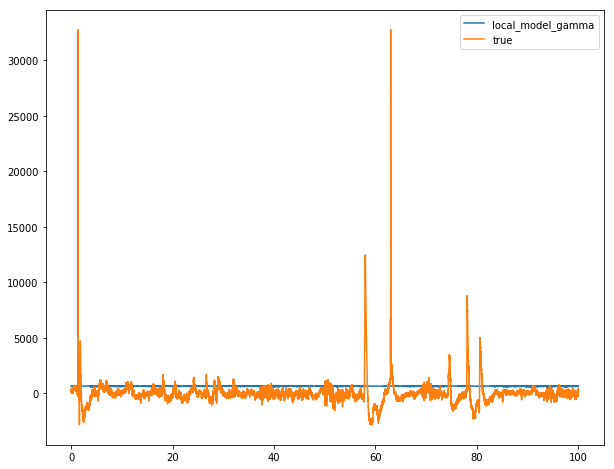

Wall time: 13.2 s


In [101]:
%%time
from scipy.stats import wishart
channel = 14 #32-200(1191) 17-100(1018) 1-200(877) 0-300(820) 63 - 500(497)
point = centers[channel]
plt.figure(figsize = (10, 8))
g_d = []
for j in range(len(m)):
    p = wishart.pdf(point, 2, [[m[j, 0], 0], [0, m[i, 1]]])
    g_d.append(p*0.5e7)
plt.plot(time[:N], g_d, label = 'local_model_gamma')
#plt.plot(t[:N], -(np.array(rv)-np.array(g_d)), label = 'local_model_gauss')
plt.plot(time[:N], data[:N, channel], label = 'true')
plt.legend()
plt.show()

### Тупо линейная модель по параметрам среднего, дисперсии и интенсивности. Бесит.

In [112]:
df = pd.DataFrame(m)

In [113]:
df[2] = d[:,0]
df[3] = d[:,1]
df[4] = intens

In [114]:
from sklearn.linear_model import LinearRegression

In [115]:
def reg_df(data, time, N):
    data = data[:N, :]
    time = time[:N]
    maxi = []
    mini = []
    maxc = []
    minc = []
    for i in range(len(time)):
        mx = data[i,:].max()
        mn = data[i,:].min()
        maxi.append(mx)
        mini.append(mn)
        l = list(data[i,:])
        maxc.append(l.index(mx))
        minc.append(l.index(mn))
    return pd.DataFrame([maxi, mini, maxc, minc]).T

In [116]:
channel = 14
y_train = data[:len(m), channel]

In [144]:
reg = LinearRegression().fit(df, y_train)

In [145]:
yp = reg.predict(df)
reg.coef_

array([11.21494558,  3.27722853, 21.35157667,  0.39685734,  0.95869707])

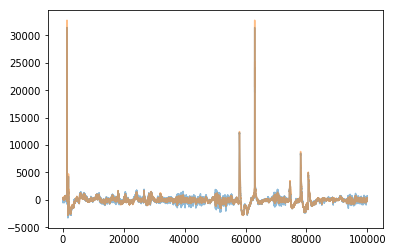

In [146]:
#plt.plot(range(20000, 40000),yp[20000:40000], alpha = 0.5)
#plt.plot(range(20000, 40000),y_train[20000:40000], alpha = 0.5)
plt.plot(range(len(m)),yp, alpha = 0.5)
plt.plot(range(len(m)),y_train, alpha = 0.5)


In [147]:
mean_absolute_error(yp, y_train)

106.55783313793417

In [149]:
%%time
data_t, time_t = get_ecog(path_name_test)
#df_test =reg_df(data_t, time_t, N)
mt = get_mean(data_t[:len(m)], time_t[:len(m)])
dt = get_disp(mt, data_t[:len(m)], time_t[:len(m)])

mu_xt = m[:,0]
mu_yt = m[:,1]
variance_xt = d[:,0]
variance_yt = d[:,1]
mvt = []
for i in range(len(mu_xt)):
    mvt.append(multivariate_normal([mu_xt[i], mu_yt[i]], [[variance_xt[i], 0], [0, variance_yt[i]]]))



Wall time: 1min 4s


In [150]:
i_t = get_intens(mt, dt, mvt,data_t[:len(m)], time_t[:len(m)] )

In [151]:
df_test = pd.DataFrame(mt)
df_test[2] = dt[:,0]
df_test[3] = dt[:,1]
df_test[4] = i_t

In [152]:
y_test_pred = reg.predict(df_test)
y_test = data_t[:len(m), channel]

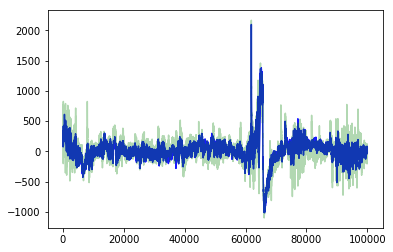

In [159]:
plt.plot(range(len(m)),y_test, alpha = 0.9, color = 'blue')
plt.plot(range(len(m)),y_test_pred, alpha = 0.3, color = 'green')

In [157]:
from sklearn.metrics import r2_score
r2_score(y_test,y_test_pred)

0.6628672720149075